# Scale-Invariant Feature Transform Implementation

### Rama Lesmana, 1313617011
### M. Luthfi Albiansyah, 1313617033

In [ ]:
import numpy as np
from numpy.fft import fft2, ifft2
import cv2
from skimage import io
import matplotlib.pyplot as plt
from urllib.request import urlopen
import sys

##Image Load into Grayscale

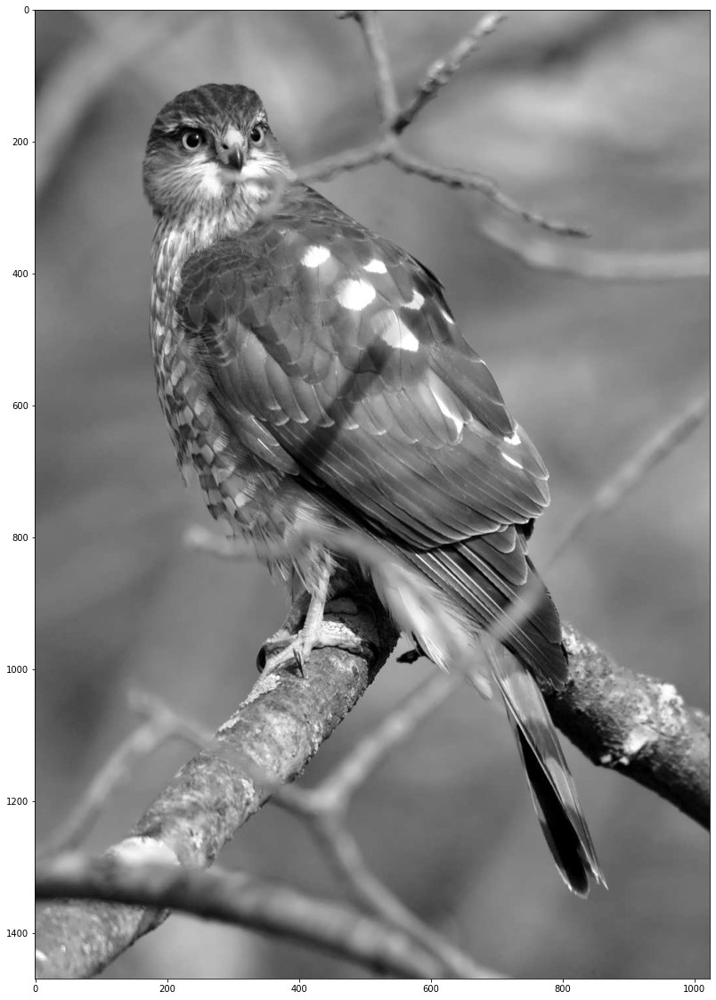

In [ ]:
path= "https://www.animalspot.net/wp-content/uploads/2014/12/Pictures-of-Sharp-Shinned-Hawk.jpg"
resp = urlopen(path)
image = np.asarray(bytearray(resp.read()), dtype="uint8")
imageGray = cv2.imdecode(image,cv2.IMREAD_GRAYSCALE)

plt.figure(figsize = (50,20))
plt.imshow(imageGray, cmap='gray')
plt.show()

In [ ]:
def scaling(img, scale):
  """Scale the image array into another size"""
  H = get_scaling(scale)
    
  res = transform(img, H, scale)
  return res
  
def transform(img, A, scale):
    res = np.zeros((int(img.shape[0]*scale), int(img.shape[1]*scale)))
    row, column = img.shape[:2]

    for xx in range(row):
        for yy in range(column):
            XY1 = np.array([xx,yy,1])
            new_XY = np.array(A @ XY1)
            new_XY = np.round(new_XY / new_XY[2]).astype(np.int)
            
            if check_out_of_bound(row, column, new_XY):
                continue
                
            try:
                #res[xx,yy] = img[new_XY[0], new_XY[1]]
                res[new_XY[0], new_XY[1]] = img[xx,yy]
            except IndexError:
                continue
    return res
  
def get_scaling(scale):
    return np.array([
        [scale, 0, 0],
        [0, scale, 0],
        [0, 0, 1]
    ])

def check_out_of_bound(h, w, xy):
    if (xy[0] > w-1 or xy[0] < 0):
        return True
    if (xy[1] > h-1 or xy[1] < 0):
        return True
    return False

In [ ]:
# Re-scale the original image into a reasonable size

m,n = imageGray.shape
m_w, n_h = np.round(1500 / m, 1), np.round(1500 / n, 1)

scale1 = min(m_w, n_h)

print(scale1)

1.0


In [ ]:
if scale1 <= 0.5:
  imageGray = scaling(imageGray, scale1)

print(imageGray.shape)

(1469, 1024)


## VARIABLES

In [ ]:
SIGMA = 1.6
K = np.sqrt(2)
SHAPE = 20
OCT = 5

CONTRAST_THRESHOLD = 0.15
R_THRESHOLD = 5

## Building Essential Methods

In [ ]:
def normalize(array : np.ndarray, scale = 255.0) -> np.ndarray:
  """ Normalize a given array
  Input:
  - array : Numpy array
  - scale : Normalized max, default = 255
  """

  return array / array.max() * scale

def plotImage(image : np.ndarray, cmap, figsize : tuple = (50,20)):
  """Plot an image to a certain figure size"""

  plt.figure(figsize=figsize)
  if cmap == "normal":
    plt.imshow(image)
  else:
    plt.imshow(image, cmap=cmap)
  plt.show()

def plotImage1DArray(imageArray : list, cmap, figsize : tuple = (15,10)):

  m = len(imageArray)
  fig, axs = plt.subplots(m, figsize=figsize)

  for img in range(m):
    axs[img].imshow(imageArray[img], cmap=cmap)
  
  plt.show()

def plotImage2DArray(imageArray : list, cmap, figsize : tuple = (15,10)):
  
  m, n = len(imageArray), len(imageArray[0])
  fig, axs = plt.subplots(m, n, figsize=figsize)

  for row in range(m):
    for col in range(n):
      axs[row][col].imshow(imageArray[row][col], cmap=cmap)

  plt.show()

In [ ]:
def gaussian(lst, sigma):
  return np.array([( (1 / 2*np.pi*sigma) * np.exp( -(x**2 / 2*sigma**2))) for x in lst])

def DifferentOfGaussianFilter(sigma1, sigma2, shape = 10): 
    s1, s2 = min(sigma1, sigma2), max(sigma1, sigma2)
    gaussianResult = generate_gaussian_kernel(s1, shape) - generate_gaussian_kernel(s2, shape)
    return gaussianResult

def conv(M, K):
    return np.fft.irfft2(np.fft.rfft2(M) * np.fft.rfft2(K, M.shape))

def generate_gaussian_kernel(sigma, shape : int = 10) -> np.ndarray:
  """ Return a 2D Gaussian kernel
  Input:
  - sigma
  - shape: Returns (shape,shape) window, default=10
  """
  min = shape//2
  max = np.ceil(shape/2)
  X, Y = np.mgrid[-min:max:1, -min:max:1]

  res = (1/(2*np.pi*sigma**2)) * np.exp(-(X**2 + Y**2)/(2*sigma**2))

  return res

def conv2(image : np.ndarray, filter : np.ndarray) -> np.ndarray:
  """ Convolve 2 array
  Input:
  - image: Original array to be convolved
  - filter : Convolution kernel
  """
  fxx, fyy = filter.shape
  fx = fxx // 2
  fy = fyy // 2

  m, n = image.shape
  image = cv2.copyMakeBorder(image, fy, fy, fx, fx, cv2.BORDER_REPLICATE)

  res = np.zeros((m,n))

  for x in range(0, m):
    for y in range(0, n):
      w = image[x:x+fxx,y:y+fyy]
      conv = np.sum(np.multiply(filter, w))
      res[x,y] = conv
  return res

In [ ]:
GaussianFilter = generate_gaussian_kernel(SIGMA, SHAPE)
imageTest = conv2(imageGray, GaussianFilter)

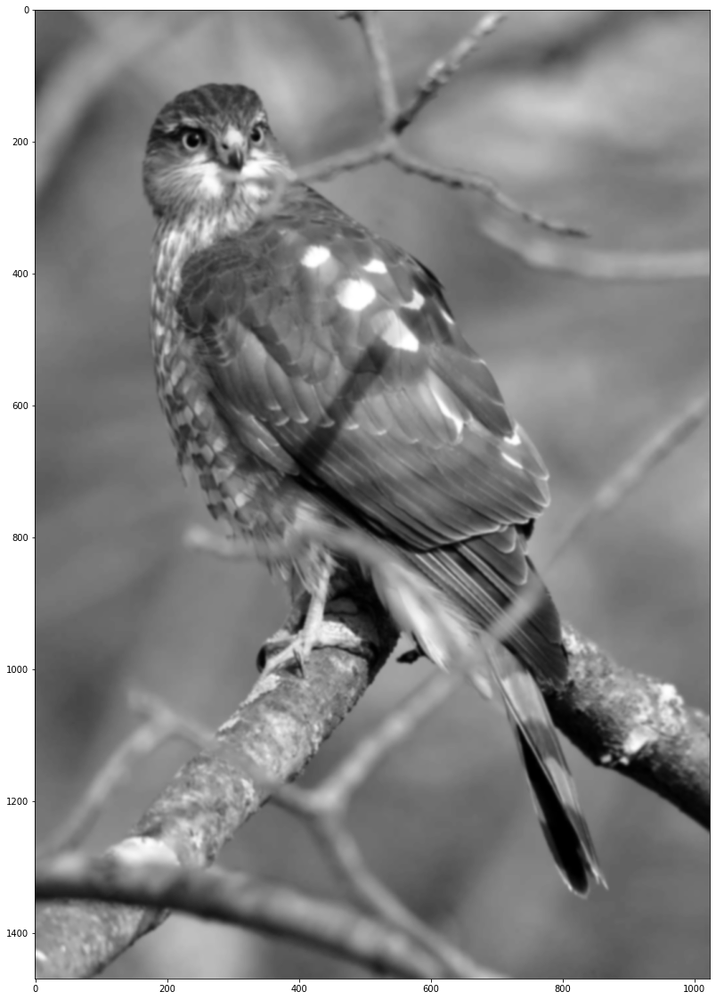

In [ ]:
plotImage(imageTest,cmap = 'gray')

(1469, 1024)
(734, 512)


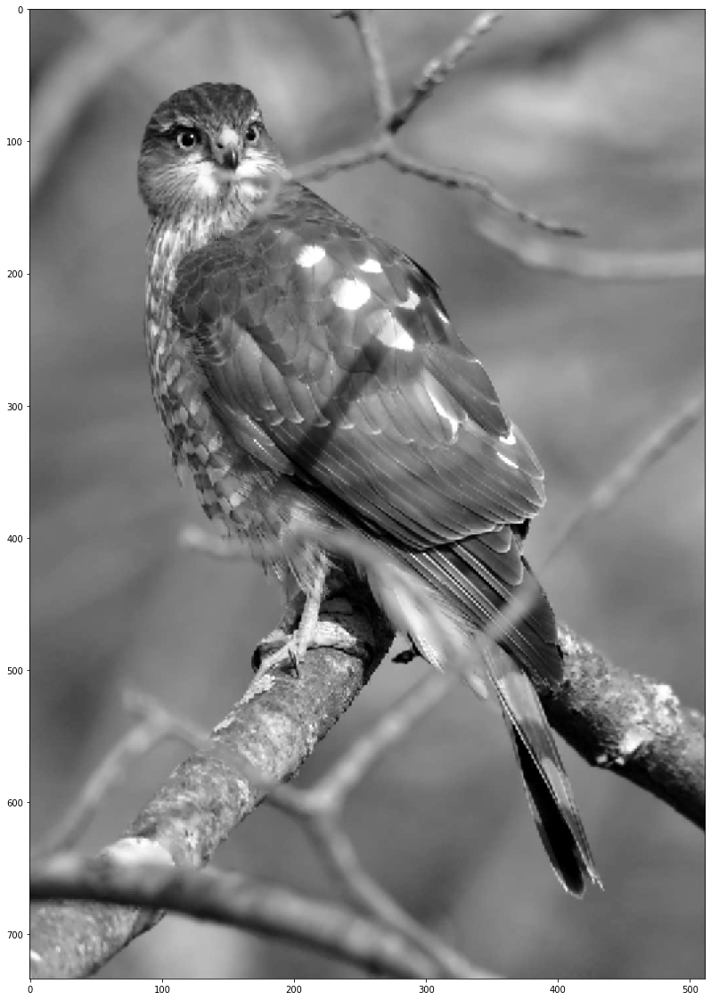

In [ ]:
imageTest2 = scaling(imageGray, 0.5)
print(imageGray.shape)
print(imageTest2.shape)
plotImage(imageTest2, cmap="gray")

## Generate Array of Image with different scale



In [ ]:
def getPyramidOfImage(image : np.ndarray, stop : int = 5) -> list:
  """Returns an array of half the size of the previous one
  Input:
  - image: Original image array
  - stop: How many image in the array
  """
  img = image.copy()
  print(img.shape)
  poi = []
  poi.append(img)
  count=1
  while count<stop:
    img = scaling(img, .5)
    poi.append(img)
    count+=1
  return poi

In [ ]:
poi = getPyramidOfImage(imageGray, stop = 4)

(1469, 1024)


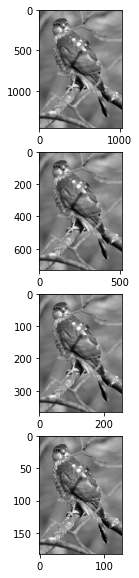

In [ ]:
plotImage1DArray(poi,cmap = 'gray')

## Generate Pyramid of Gaussian-weighted Images

In [ ]:
def getPyramidOfGaussian(poi, sigma = 1.6, k = np.sqrt(2), shape = 10, oct : int = 5) -> list:
  """Return an array of Pyramid of Gaussian
  Input:
  - poi = Pyramid of Image array
  - sigma
  - k = How much the sigma changes to the next level
  - oct = How many image per octave / scale
  """
  pog = []
  for imageCount in range(len(poi)):
    podPerImageSize = []
    for iteration in range(oct):
      sigma_cumu = sigma * (k**iteration)
      print(imageCount, iteration, sigma_cumu)
      gaussian = generate_gaussian_kernel(sigma_cumu, shape)
      podPerImageSize.append(normalize(conv(poi[imageCount], gaussian), scale=1.0))
    pog.append(podPerImageSize)
  return pog

In [ ]:
pog = getPyramidOfGaussian(poi, sigma=SIGMA, k=K, shape=SHAPE, oct=OCT)

0 0 1.6
0 1 2.2627416997969525
0 2 3.200000000000001
0 3 4.525483399593905
0 4 6.400000000000002
1 0 1.6
1 1 2.2627416997969525
1 2 3.200000000000001
1 3 4.525483399593905
1 4 6.400000000000002
2 0 1.6
2 1 2.2627416997969525
2 2 3.200000000000001
2 3 4.525483399593905
2 4 6.400000000000002
3 0 1.6
3 1 2.2627416997969525
3 2 3.200000000000001
3 3 4.525483399593905
3 4 6.400000000000002


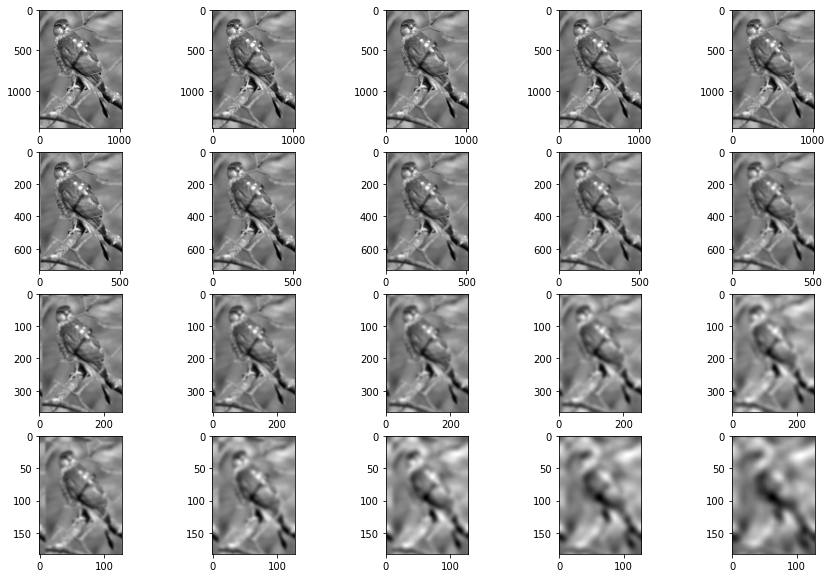

In [ ]:
plotImage2DArray(pog, cmap = 'gray')

## Generate Pyramid of Difference of Gaussian

In [ ]:
def Difference(g1, g2):
  return np.abs(g2 - g1)

def getPyramidOfDifferenceOfGaussian(pog : list) -> list:
  """Return an array of Pyramid of Difference of Gaussian
  Input:
  - pog = Pyramid of Gaussian array
  """
  podg2 = []
  for i in range(len(pog)):
    podg2PerScale = []
    for j in range(len(pog[i]) - 1):
      podg2PerScale.append(normalize(Difference(pog[i][j], pog[i][j+1]),scale=1.0))
    podg2.append(podg2PerScale)
  return podg2

In [ ]:
podg = getPyramidOfDifferenceOfGaussian(pog)

In [ ]:
print(podg[0][0].min())
print(podg[0][0].max())
print(podg[0][0] == podg[0][1])

0.0
1.0
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


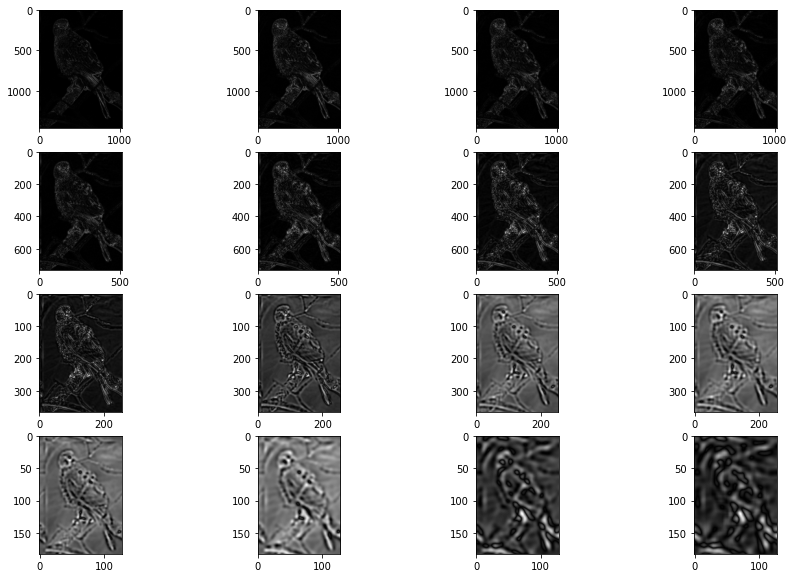

In [ ]:
plotImage2DArray(podg, cmap = 'gray')

## Scale-space extrema detection

In [ ]:
def spasca_extrema(podg : list) -> (list, list):
  """Detects the keypoint candidate from a Pyramid of Difference of Gaussian array
  Input:
  - podg = Pyramid of Difference of Gaussian array
  """
  podg = np.array(podg)
  print(podg.shape)
  scale, sigma = podg.shape

  maxima = []
  minima = []
  print(scale, sigma)
  has_printed_max = False
  has_printed_min = False
  for scaleCount in range(scale):
    for sigmaCount in range(1,sigma-1):
      row, col = podg[scaleCount, sigmaCount].shape
      for x in range(1,row-1):
        for y in range(1,col-1):
          is_max, is_min = False, False
          row1 = podg[scaleCount,sigmaCount-1][x-1:x+2,y-1:y+2]
          row2 = podg[scaleCount,sigmaCount][x-1:x+2,y-1:y+2]
          row3 = podg[scaleCount,sigmaCount+1][x-1:x+2,y-1:y+2]
          cut = np.array([row1,row2,row3])

          is_max = is_extrema(cut, True)
          if not is_max:
            is_min = is_extrema(cut, False)

          if is_max:
            if not has_printed_max:
              print(row1,row2,row3)
              has_printed_max = True
            maxima.append([x,y,sigmaCount-1,scaleCount])
          elif is_min:
            if not has_printed_min:
              print(row1,row2,row3)
              has_printed_min = True
            minima.append([x,y,sigmaCount-1,scaleCount])
  return maxima, minima
          
def is_extrema(cut, maxima=True):
  sig, row, col = cut.shape
  if maxima:
    is_extreme = cut[sig//2,row//2,col//2] == cut.max()
    extreme_count = np.count_nonzero(cut.max())
    return is_extreme and (extreme_count == 1)
  else:
    is_extreme = cut[sig//2,row//2,col//2] == cut.min()
    extreme_count = np.count_nonzero(cut.min())
    return is_extreme and (extreme_count == 1)

In [ ]:
maxima, minima = spasca_extrema(podg)
print(len(maxima))
print(len(minima))

(4, 4)
4 4
[[0.0010671  0.00025225 0.00219287]
 [0.00380288 0.00258254 0.0009725 ]
 [0.005925   0.00483346 0.0035452 ]] [[2.85204403e-04 8.60512695e-04 2.51115372e-03]
 [9.90064865e-04 1.50008688e-05 1.58444703e-03]
 [2.03119123e-03 2.96209596e-03 4.62060724e-03]] [[0.00590162 0.00629029 0.0067585 ]
 [0.01589499 0.01658824 0.01752634]
 [0.02988495 0.03098616 0.03248501]]
[[0.00588853 0.0076573  0.00629463]
 [0.00794124 0.00967147 0.00818288]
 [0.00967809 0.01141864 0.00994733]] [[0.00892416 0.01108138 0.01065443]
 [0.00974691 0.01199003 0.01168912]
 [0.00831701 0.01051857 0.0104592 ]] [[0.00529538 0.0066381  0.00692418]
 [0.00239221 0.00397613 0.00463494]
 [0.00221388 0.00046504 0.00060613]]
13110
50227


In [ ]:
def merge_keypoints_across_scale(keypoints):
  """Merge the keypoint from different scaled images"""
  nu_key = []

  for i,key in enumerate(keypoints):
    if i < 3:
      print(key)

    x, y, sig, scale = key

    nu_x, nu_y = x * 2**scale, y * 2**scale
    nu_key.append(np.array([nu_x, nu_y, sig]))
  return np.array(nu_key)

maxima = merge_keypoints_across_scale(maxima)
minima = merge_keypoints_across_scale(minima)

[1, 947, 0, 0]
[1, 973, 0, 0]
[1, 982, 0, 0]
[1, 253, 0, 0]
[1, 364, 0, 0]
[1, 391, 0, 0]


In [ ]:
print(np.array(maxima[:,0]).max())
print(np.array(maxima[:,1]).max())
print(imageGray.shape)

1467
1022
(1469, 1024)


In [ ]:
def imageDot(img, keypoints):
  new_img = cv2.cvtColor(np.array(normalize(img), dtype = np.uint8), cv2.COLOR_GRAY2RGB)
    
  for key in keypoints:
    try:
      x, y, sig = key
      new_img[x][y] = [255,0,0]
      new_img[x-1][y] = [255,0,0]
      new_img[x+1][y] = [255,0,0]
      new_img[x][y-1] = [255,0,0]
      new_img[x][y+1] = [255,0,0]
    except Exception as e:
      continue
  return new_img

def imageDotColored(img, keypoints):
  for key in keypoints:
    try:
      x, y, sig = key
      img[x][y] = [255,0,0]
    except Exception as e:
      continue
  return img

13110


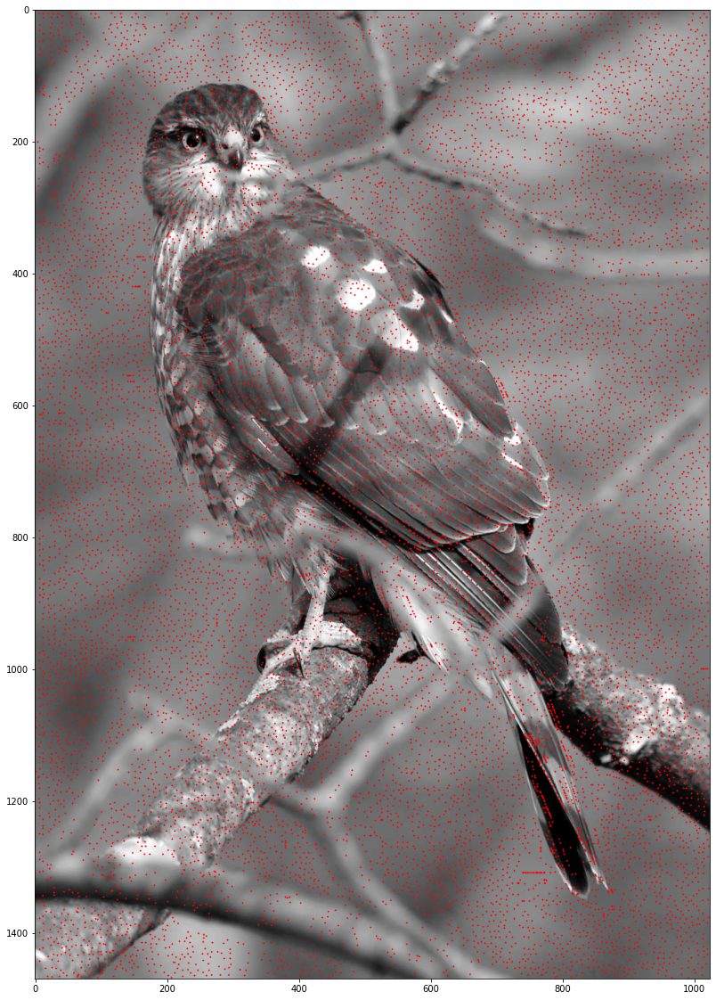

In [ ]:
print(len(maxima))
maxss = imageDot(imageGray, maxima)

plotImage(maxss, cmap = 'gray')

50227


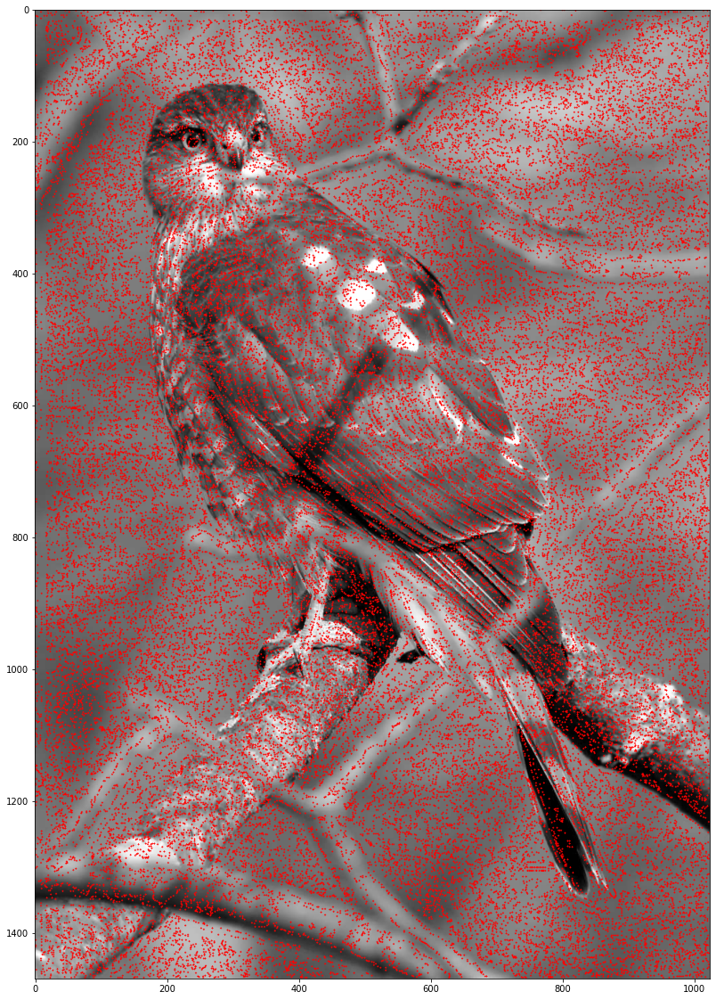

In [ ]:
print(len(minima))
minss = imageDot(imageGray, minima)

plotImage(minss, cmap = 'gray')

##Accurate Keypoint Localization

In [ ]:
# Sebagian dari kode di sel ini diambil dari https://medium.com/@lerner98/implementing-sift-in-python-36c619df7945

def localize_keypoint(D, x, y, s): #x, y, sigma, scaleCount,   D == DoGResult
  D = np.array(D)
  #print ("coords",x, y, s)
  
  dx = (D[0, s][x+1, y] - D[0, s][x-1, y]) / 2
  dy = (D[0, s][x, y+1] - D[0, s][x, y-1]) / 2
  ds = (D[0, s+1][x, y] - D[0, s-1][x, y]) / 2
  #print("dxys",[dx,dy,ds])

  dxx = D[0, s][x+1, y] - 2 * D[0, s][x, y] + D[0, s][x-1, y]
  dyy = D[0, s][x, y+1] - 2 * D[0, s][x, y] + D[0, s][x, y-1]
  dss = D[0, s+1][x, y] - 2 * D[0, s][x, y] + D[0, s-1][x, y]
  #print("dxxdyydss", [dxx,dyy,dss])

  dxy = ((D[0, s][x+1, y+1] - D[0, s][x-1, y+1]) - (D[0, s][x+1, y-1] - D[0, s][x-1, y-1]))/4
  dxs = ((D[0, s+1][x+1, y] - D[0, s+1][x-1, y]) - (D[0, s-1][x+1, y] - D[0, s-1][x-1, y]))/4
  dys = ((D[0, s+1][x, y+1] - D[0, s+1][x, y-1]) - (D[0, s-1][x, y+1] - D[0, s-1][x, y-1]))/4
  #print("dxydxsdys",[dxy,dxs,dys])

  jacobian = np.array([dx, dy, ds]) 
  hessian = np.array([[dxx, dxy, dxs], [dxy, dyy, dys], [dxs, dys, dss]])
  #print("jac",jacobian)
  #print("hes",hessian)
  X_hat = -np.linalg.inv(hessian).dot(jacobian) #hasil turunan?
  return X_hat, jacobian, hessian[:2,:2]

def getKeypoint(DoGPyramid, extrema, threshold = .03, r_th = 10):
  filtered_cont = 0
  filtered_edge = 0
  keypoint = []
  for index, X in enumerate(extrema):
    #print(X)
    x, y, s = X
  
    try:
      X_hat, jacobian, hessian = localize_keypoint(DoGPyramid, x, y, s)
    
    except Exception as e:
      print(e)
      continue

    contrast = DoGPyramid[0][s][x, y] + .5 * jacobian.dot(X_hat)
    if abs(contrast) < threshold:
      filtered_cont+=1
      continue

    #w, v = np.linalg.eig(hessian)
    #r = w.max()/w.min()
    R = calculate_R(hessian)
    R_th = (r_th+1)**2/r_th
    if R > R_th: 
      filtered_edge+=1
      continue

    #print(np.array([x, y, s]), X_hat)
    keypoint.append(np.append(np.array([x, y]) + np.round(X_hat[:2]), s))
  print("Filtered Contrasts: ",filtered_cont)
  print("Filtered Edges: ",filtered_edge)
  return np.array(keypoint,dtype='int')

def calculate_R(H):
  Tr_H = H[0,0] + H[1,1]
  Det_H = H[0,0]*H[1,1] - (H[0,1]*H[1,0])
  return Tr_H**2 / Det_H

In [ ]:
def merge_extrema(maxima, minima):
  return np.concatenate((maxima,minima), axis=0)

extrema = merge_extrema(maxima, minima)

print(extrema)

[[   1  947    0]
 [   1  973    0]
 [   1  982    0]
 ...
 [1416  480    1]
 [1424  848    1]
 [1448  136    1]]


In [ ]:
keyP = getKeypoint(podg, extrema, threshold = .20, r_th = 3)
print (keyP)
print (keyP.shape)

Filtered Contrasts:  59333
Filtered Edges:  2124
[[ 280   89    0]
 [   7   12    0]
 [  -3   17    0]
 ...
 [ 778  380    1]
 [ 864  467    1]
 [1375  210    1]]
(1880, 3)


In [ ]:
def discard_OOB_keys(img, keys, shape=10, ratio=0.99):
  nu_key = []
  sha = int(shape//2)
  true_x, true_y = img.shape
  max_x, max_y = (true_x * ratio)-sha, (true_y * ratio)-sha
  min_x, min_y = (true_x * (1-ratio))+sha, (true_y * (1-ratio))+sha
  for key in keys:
    x, y, s = key
    if x >= max_x or x < min_x:
      continue
    if y >= max_y or y < min_y:
      continue
    nu_key.append(np.array([x, y, s]))
  return np.array(nu_key)

keyP = discard_OOB_keys(imageGray, keyP)
print(keyP.shape)

(1780, 3)


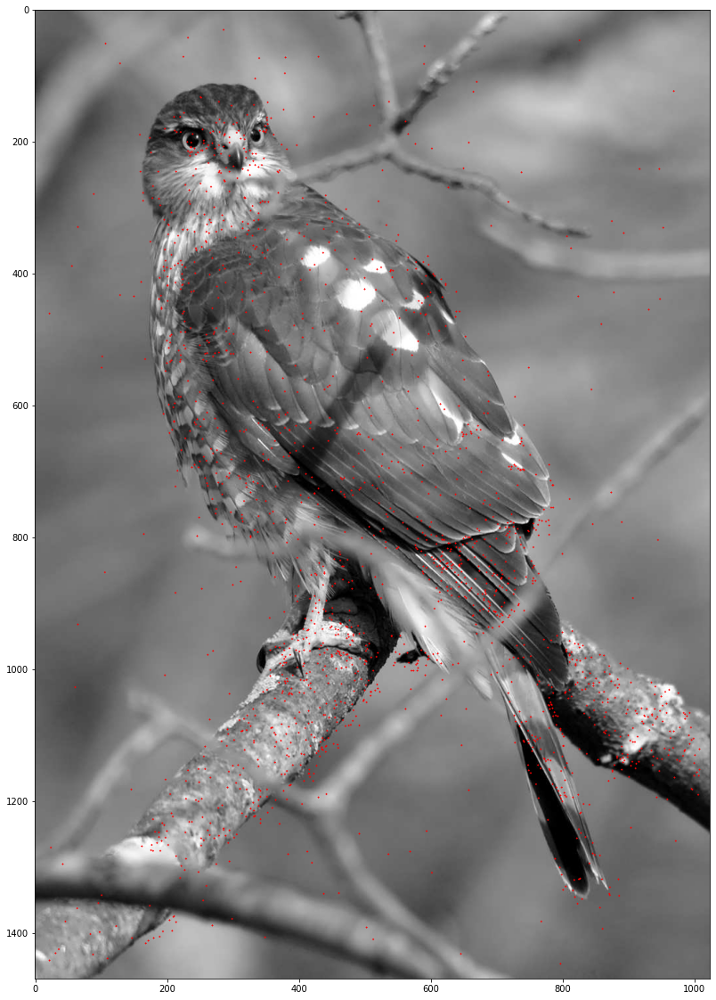

In [ ]:
keys = imageDot(imageGray, keyP)

plotImage(keys, cmap='gray')

##Orientation assignment

In [ ]:
def calculate_gra_ori(L, x, y):
  gradient = np.sqrt( (L[x+1][y] - L[x-1][y])**2 + (L[x][y+1] - L[x][y-1])**2 )

  orientation = np.arctan( (L[x][y+1] - L[x][y-1]) / (L[x+1][y] - L[x-1][y]) ) 
  orientation = np.nan_to_num(orientation)
  
  orientation *= 180
  orientation = orientation % 360

  return gradient, orientation

def orientation_assignment(img, keys, shape=16, g_shape=10, sigma=1.6, k=np.sqrt(2)):
  orientations = []
  sha = int(shape//2)
  G = []

  for sig in range(keys[:,2].max()+1):
    sigma_now = sigma * (k**sig) * 1.5
    gaussian = generate_gaussian_kernel(sigma_now, g_shape)
    G.append(conv(imageGray, gaussian))

  print(len(G))

  for k in keys:
    x, y, s = k
    
    #grads = np.zeros((sha+1,sha+1))
    #orients = np.zeros((sha+1,sha+1))
    hist = np.zeros(int(360/10))

    for i in range(-sha, sha+1):
      for j in range(-sha, sha+1):  
        if (np.sqrt((i)**2+(j)**2)>sha):
          continue
        
        # print("we are here")
        try:
          gradient, orientation = calculate_gra_ori(G[s], x+i, y+j)
        
          #grads[i+sha,j+sha] = gradient
          #orients[i+sha,j+sha] = orientation

          hist[int(np.round(orientation/10, 0)% 36)] += gradient
        except Exception as e:
          print(gradient, orientation, x, i, y, j)

    for i in range(len(hist)):
      if hist[i] >= hist.max() * 0.8:
        #print(hist[i], hist.max() * 0.8)
        orientations.append([x, y, s, i*10])

  return np.array(orientations)

In [ ]:
test = np.zeros((11,11))
for i in range(-5,6):
  for j in range(-5,6):
    if (np.sqrt((i)**2+(j)**2)>5):
        continue
    test[i+5,j+5] = 1
print(test)

[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0.]
 [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


In [ ]:
orientations = orientation_assignment(imageGray, keyP, shape=SHAPE, g_shape=SHAPE, k=K)

2


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in double_scalars
  after removing the cwd from sys.path.


In [ ]:
print(keyP.shape)
print(orientations.shape)
print(keyP)
print(orientations)

(1780, 3)
(3713, 4)
[[ 280   89    0]
 [ 214  252    0]
 [ 134  252    0]
 ...
 [ 778  380    1]
 [ 864  467    1]
 [1375  210    1]]
[[ 280   89    0  210]
 [ 280   89    0  220]
 [ 214  252    0  260]
 ...
 [1375  210    1  100]
 [1375  210    1  110]
 [1375  210    1  320]]


In [ ]:
def imageArrow(image, key_ori):
  #new_img = cv2.cvtColor(np.array(normalize(image), dtype = np.uint8), cv2.COLOR_GRAY2RGB)

  plt.figure(figsize=(50,20))

  plt.imshow(image)

  for key in key_ori:
    y, x, s, angle = key
    rad_angle = np.deg2rad(angle)

    dx = int(np.cos(rad_angle)*10)
    dy = int(np.sin(rad_angle)*10)

    plt.arrow(x, y, dx, dy, color=[1,0,0])

  plt.show()

def imageArrowGS(image, key_ori):
  image = cv2.cvtColor(np.array(normalize(image), dtype = np.uint8), cv2.COLOR_GRAY2RGB)

  plt.figure(figsize=(50,20))

  plt.imshow(image)

  for key in key_ori:
    y, x, s, angle = key
    rad_angle = np.deg2rad(angle)

    dx = int(np.cos(rad_angle)*10)
    dy = int(np.sin(rad_angle)*10)

    plt.arrow(x, y, dx, dy, color=[1,0,0])

  plt.show()

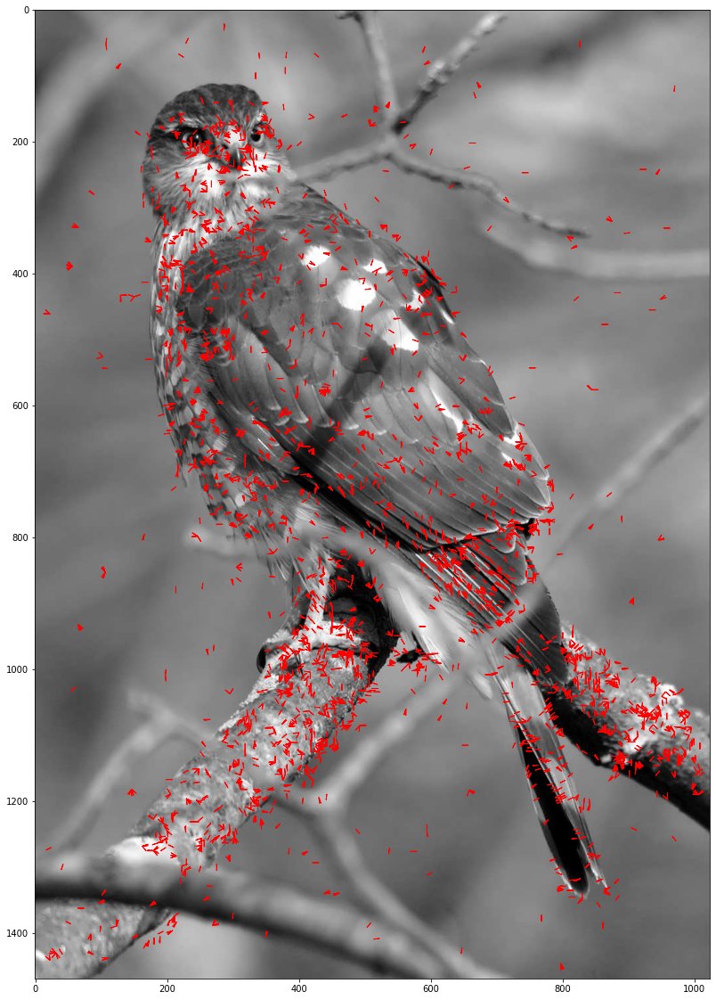

In [ ]:
#imageArrow(imageColor,orientations)
imageArrowGS(imageGray,orientations)

In [ ]:
imageColor = cv2.imdecode(image,cv2.IMREAD_COLOR)
(m,n) = imageGray.shape
imageColor = cv2.resize(imageColor, (n,m))

imageColor = cv2.cvtColor(imageColor, cv2.COLOR_BGR2RGB)
print(imageColor.shape)
print(imageGray.shape)

(1469, 1024, 3)
(1469, 1024)


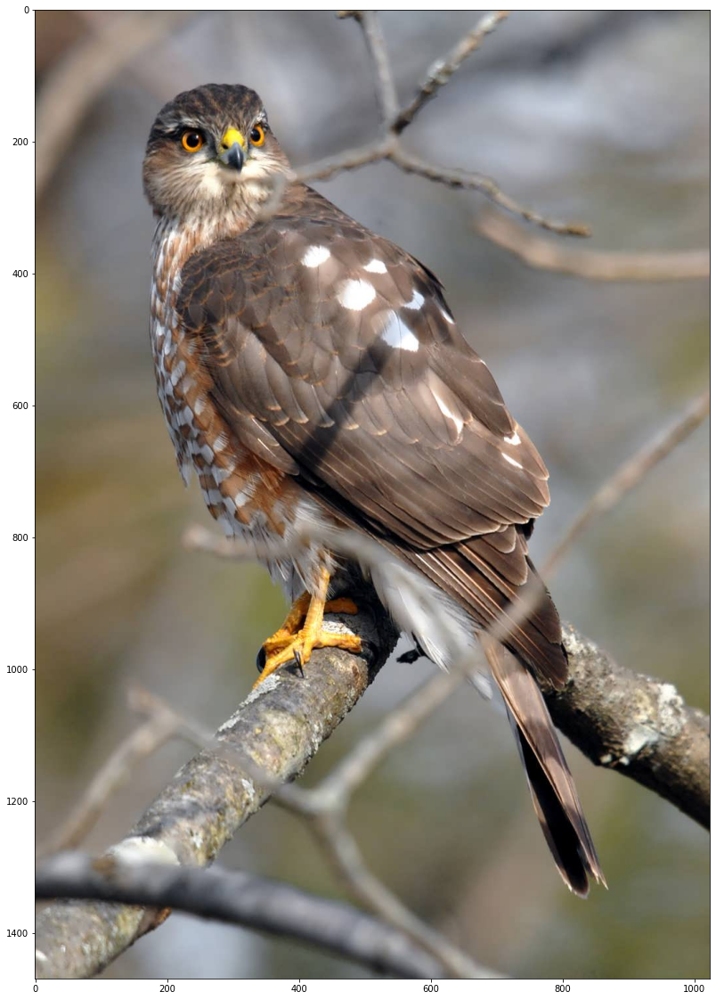

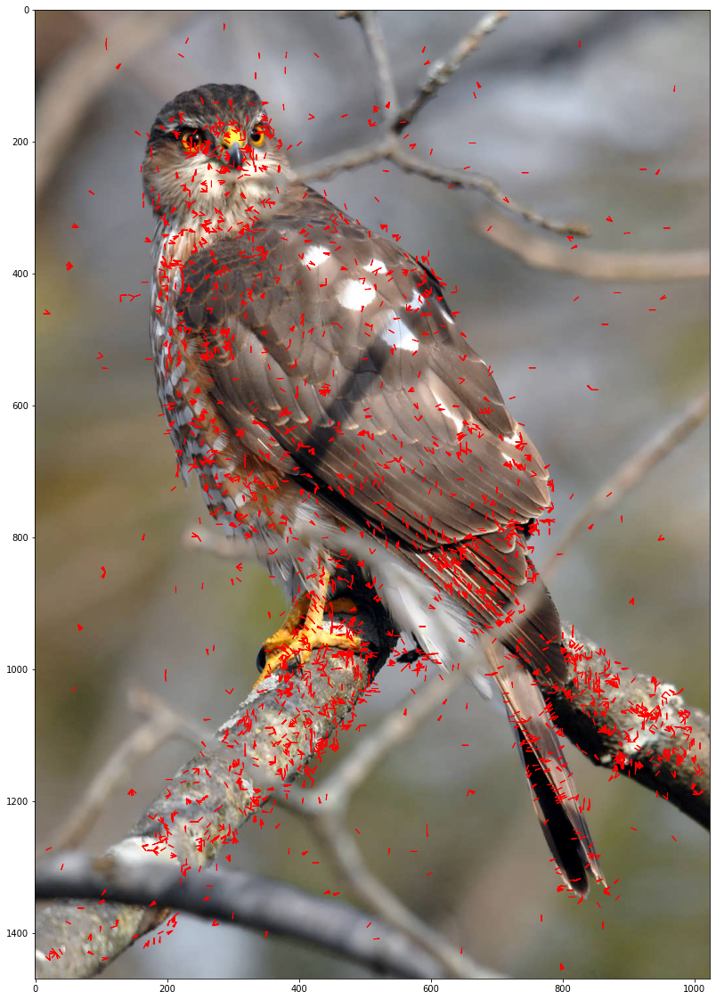

In [ ]:
plotImage(imageColor, cmap="normal")
imageArrow(imageColor, orientations)

##Local descriptor

In [ ]:
def local_Descriptor(img, keys, shape=16, chunk_size=4, n_bin=8, g_shape=10, sigma=1.6, k=np.sqrt(2)):
  orientations = []
  sha = int(shape//2)
  G = []
  angle = 360 / n_bin

  for sig in range(keys[:,2].max()+1):
    sigma_now = sigma * (k**sig) * 1.5
    gaussian = generate_gaussian_kernel(sigma_now, g_shape)
    G.append(conv(imageGray, gaussian))

  print(len(G))

  for k in keys:
    x, y, s = k
    
    #grads = np.zeros((sha+1,sha+1))
    #orients = np.zeros((sha+1,sha+1))
    hist = np.zeros(shape = (chunk_size, chunk_size, n_bin))

    for largeX in range(-2, 2):
      for largeY in range(-2, 2):
        for smallX in range(0, 4):
          for smallY in range(0, 4):
            i, j = 4*largeX + smallX, 4*largeY + smallY
            gradient, orientation = calculate_gra_ori(G[s], x+i , y+j)
            hist[largeX, largeY,int(np.round(orientation/angle, 0)) % n_bin] += gradient
    
    hist /= np.sqrt(np.sum(np.power(hist, 2)))
    hist[hist>0.2] = 0.2
    hist /= np.sqrt(np.sum(np.power(hist, 2)))

    orientations.append(hist)

  return np.array(orientations)

In [ ]:
descriptor = local_Descriptor(imageGray, keyP, g_shape=SHAPE, sigma=SIGMA, k=K)

2


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in double_scalars
  after removing the cwd from sys.path.


In [ ]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format}, threshold=np.inf)
print(descriptor[:3])

[[[[ 0.000  0.000  0.000  0.000  0.021  0.262  0.000  0.000]
   [ 0.000  0.000  0.000  0.055  0.176  0.039  0.000  0.000]
   [ 0.000  0.000  0.000  0.000  0.000  0.262  0.054  0.000]
   [ 0.000  0.000  0.000  0.000  0.000  0.262  0.000  0.000]]

  [[ 0.000  0.000  0.000  0.000  0.000  0.089  0.262  0.000]
   [ 0.000  0.000  0.000  0.000  0.012  0.117  0.118  0.000]
   [ 0.000  0.000  0.000  0.000  0.000  0.022  0.262  0.000]
   [ 0.000  0.000  0.000  0.000  0.000  0.087  0.255  0.000]]

  [[ 0.000  0.000  0.000  0.099  0.212  0.067  0.000  0.000]
   [ 0.000  0.000  0.000  0.184  0.146  0.000  0.000  0.000]
   [ 0.000  0.000  0.000  0.000  0.262  0.036  0.000  0.000]
   [ 0.000  0.000  0.000  0.000  0.262  0.102  0.000  0.000]]

  [[ 0.000  0.000  0.000  0.000  0.000  0.262  0.000  0.000]
   [ 0.000  0.000  0.000  0.000  0.049  0.190  0.000  0.000]
   [ 0.000  0.000  0.000  0.000  0.000  0.262  0.000  0.000]
   [ 0.000  0.000  0.000  0.000  0.000  0.262  0.000  0.000]]]


 [[[ 0.000  0.